# Large scale features of Early Science MCS runs

In [2]:
%matplotlib inline
import xarray as xr
import numpy as np
import cartopy.crs as ccrs   # map plots
from e3sm_utils import cmclimate
cmap_prect = cmclimate.cm.WhiteBlueGreenYellowRed
import matplotlib.pyplot as plt
import pandas as pd
import cartopy.feature as cfeature
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from glob import glob
import som_interp

In [3]:
# prepare figure canvas:
states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='50m',
    facecolor='none')

## Load output

In [4]:
extent = [250 - 360, 285 - 360, 28, 49]
conus = {'lat': slice(24, 50), 'lon': slice(240, 290)}
conus_era = {'latitude': slice(50, 24), 'longitude': slice(240, 290)}

In [5]:
# load relevant data at 850 hPa
# 3-hourly CONUS for MMF and E3SM; montly for ERA
ds_mmf = xr.open_mfdataset('/global/cscratch1/sd/crjones/conus/tmp/earlyscience.FC5AV1C-H01A.ne120.sp1_64x1_1000m.850hpa.000*.nc').squeeze()
ds_e3sm = xr.open_mfdataset('/global/cscratch1/sd/crjones/conus/tmp/earlyscience.FC5AV1C-H01A.ne120.E3SM.850hpa.000*.nc').squeeze()

In [6]:
mmf850_monthly = ds_mmf.sel(**conus).groupby('time.month').mean(dim='time').load()
e3sm850_monthly = ds_e3sm.sel(**conus).groupby('time.month').mean(dim='time').load()

/global/homes/c/crjones/.conda/envs/spe3sm_env/lib/python3.7/site-packages/dask/array/numpy_compat.py:28: RuntimeWarning: divide by zero encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/c/crjones/.conda/envs/spe3sm_env/lib/python3.7/site-packages/dask/array/numpy_compat.py:28: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/c/crjones/.conda/envs/spe3sm_env/lib/python3.7/site-packages/dask/array/numpy_compat.py:28: RuntimeWarning: divide by zero encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/c/crjones/.conda/envs/spe3sm_env/lib/python3.7/site-packages/dask/array/numpy_compat.py:28: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [7]:
ds = xr.open_dataset('/global/cscratch1/sd/crjones/era5/era5_1990-2010_ls_850hpa_monthly.nc')
ds_era = ds.sel(**conus_era).groupby('time.month').mean(dim='time').load()

In [8]:
import pickle

In [9]:
with open('regional_mcs_counts.pkl', 'rb') as fp:
    regional_mcs_counts_dict = pickle.load(fp)

In [10]:
regional_count_months = np.arange(3, 11)  # March - Oct
regional_count_regions = ['ngp', 'sgp', 'ne', 'seast']

In [11]:
mmf_count_delta = regional_mcs_counts_dict['e3sm-mmf']['mean'] - regional_mcs_counts_dict['FACETS']['mean']
e3sm_count_delta = regional_mcs_counts_dict['e3sm']['mean'] - regional_mcs_counts_dict['FACETS']['mean']
facets_stdev = regional_mcs_counts_dict['FACETS']['std']

# Step 1: mask grid with SGP, NGP, SE, NE

## Regional definitions using shapefiles

In [12]:
import shapely.geometry as sgeom
import cartopy.io.shapereader as shpreader
from shapely.ops import unary_union
from shapely.prepared import prep

In [13]:
shapename = 'admin_1_states_provinces_lakes_shp'
states_shp = shpreader.natural_earth(resolution='110m',
                                     category='cultural', name=shapename)
# also need to add in "not land" and "Canada" :/
countries_shp = shpreader.natural_earth(resolution='110m', category='cultural',
                                        name='admin_0_countries')
land_shp = shpreader.natural_earth(resolution='110m', category='physical',
                                   name='land')
ocean_shp = shpreader.natural_earth(resolution='110m', category='physical',
                                    name='ocean')
lakes_shp = shpreader.natural_earth(resolution='110m', category='physical',
                                    name='lakes')
reader = shpreader.Reader(states_shp)
states = reader.records()

In [14]:
sgp_states = ['New Mexico', 'Texas', 'Oklahoma', 'Arkansas']
southeast_states = ['Louisiana', 'Mississippi', 'Alabama', 'Tennessee', 'Georgia', 'Florida', 'South Carolina', 'North Carolina']
ngp_states = ['Montana', 'Wyoming', 'Colorado', 'North Dakota', 'South Dakota', 'Nebraska', 'Kansas',
              'Minnesota', 'Iowa', 'Missouri', 'Wisconsin', 'Illinois', 'Indiana']
ne_states = ['Michigan', 'Ohio', 'Kentucky', 'Virginia', 'West Virginia', 'Massachusetts', 'Maryland', 'Connecticut', 
             'Pennsylvania', 'New York', 'Maine', 'Vermont', 'New Hampshire', 'Rhode Island', 'Delaware', 'New Jersey', 
             'District Of Columbia']
west_states = ['Washington', 'Idaho', 'Oregon', 'California', 'Nevada', 'Arizona', 'Utah']

geoms = [g for g in shpreader.Reader(states_shp).geometries()]
recs = [r for r in shpreader.Reader(states_shp).records()]

region_geoms = {}
for key, val in {'sgp': sgp_states,
                 'ngp': ngp_states,
                 'seast': southeast_states,
                 'ne': ne_states,
                 'west': west_states}.items():
    rgn_geoms = unary_union([rec.geometry for rec in recs if rec.attributes['name'] in val])
    region_geoms[key] = prep(rgn_geoms)

In [15]:
def categorize_point(point, regions, debug=False):
    candidates = []
    for reg, geom in regions.items():
        if geom.contains(point):
            candidates.append(reg)
    if not candidates:
        if debug:
            print('Uncategorized point {}'.format(point))
        return 'other'
    if len(candidates) == 1:
        return candidates[0]
    # otherwise, multiple candidate regions.
    if debug:
        print('Multiple regions for point {}: '.format(point), candidates)
    return '_'.join([c for c in candidates])


def create_mask(ds, region_geoms, add_mask=False):
    mask_ids = {key: i + 1 for i, key in enumerate(sorted(region_geoms.keys()))}  # the numerical value of the mask
    mask_ids['other'] = -1
    new_class = -1
    
    if 'lat' in ds:
        lat = ds.lat.values.copy()
        lon = ds.lon.values.copy()
        coords = ('lat', 'lon')
    else:
        lat = ds.latitude.values.copy()
        lon = ds.longitude.values.copy()
        coords = ('latitude', 'longitude')
    lon[lon > 180] = lon[lon > 180] - 360
    mask = np.zeros((len(lat), len(lon)), dtype=int)
    for i, lat0 in enumerate(lat):
        for j, lon0 in enumerate(lon):
            pt = sgeom.Point(lon0, lat0)
            reg = categorize_point(pt, region_geoms)
            if reg not in mask_ids.keys():
                new_class = new_class - 1
                mask_ids[reg] = new_class
            mask[i, j] = mask_ids[reg]
    if add_mask:
        ds.coords['mask'] = (coords, mask)
        ds['mask'].attrs['key'] = ';  '.join(['{}: {}'.format(key, val) for key, val in mask_ids.items()])
    return mask, mask_ids

In [16]:
mask_mmf, mask_ids_mmf = create_mask(mmf850_monthly, region_geoms, add_mask=True)
mask_e3sm, mask_ids_e3sm = create_mask(e3sm850_monthly, region_geoms, add_mask=True)
mask_era, mask_ids_era = create_mask(ds_era, region_geoms, add_mask=True)

In [23]:
mask_ids_mmf['ne']

1

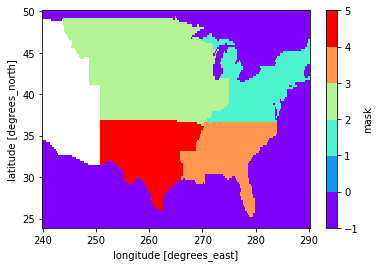

In [181]:
ds_era['mask'].plot(levels=[-1, 0, 1, 2, 3, 4, 5], cmap=plt.cm.rainbow)

In [18]:
# summary plot based
def regional_mean(ds, mask_val):
    if 'lat' in ds:
        dims = ['lat', 'lon']
    else:
        dims = ['latitude', 'longitude']
    return ds.where(ds.mask == mask_val).mean(dim=dims)

In [25]:
ds_era = ds_era.rename({'q': 'Q', 'u': 'U', 'v': 'V'})
ds_era

<xarray.Dataset>
Dimensions:    (latitude: 105, longitude: 201, month: 12)
Coordinates:
  * longitude  (longitude) float32 240.0 240.25 240.5 ... 289.5 289.75 290.0
  * latitude   (latitude) float32 50.0 49.75 49.5 49.25 ... 24.5 24.25 24.0
  * month      (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
    mask       (latitude, longitude) int64 -1 -1 -1 -1 -1 -1 ... -1 -1 -1 -1 -1
Data variables:
    Q          (month, latitude, longitude) float32 0.002444278 ... 0.0076777576
    U          (month, latitude, longitude) float32 0.6323577 ... -2.4249058
    V          (month, latitude, longitude) float32 1.9837885 ... 0.8114495

In [27]:
delta_mmf_regions = {key: regional_mean(mmf850_monthly, mask_ids_mmf[key]) - regional_mean(ds_era, mask_ids_era[key])
                     for key in mask_ids_mmf.keys()}
delta_e3sm_regions = {key: regional_mean(e3sm850_monthly, mask_ids_e3sm[key]) - regional_mean(ds_era, mask_ids_era[key])
                      for key in mask_ids_e3sm.keys()}

In [40]:
x2

<xarray.DataArray 'Q' (month: 8)>
array([-0.000131,  0.000197, -0.000376, -0.001116, -0.002043, -0.001717,
       -0.000525, -0.000462], dtype=float32)
Coordinates:
  * month     (month) int64 3 4 5 6 7 8 9 10
    pressure  int64 850

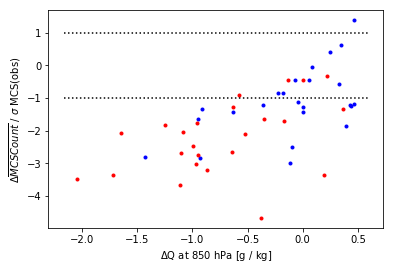

In [70]:
# scatter x-axis: delta_q
# y-axis: bias nMCS(model) -nMCS(facets) /
plot_shapes = {'ne': 's', 'seast': 'o', 'ngp': '^', 'sgp': 'd'}
months=[3, 4, 5, 6, 7, 8]
for i, region in enumerate(regional_count_regions):
    x1 = 1000 * delta_mmf_regions[region]['Q'].sel(month=months)
    y1 = mmf_count_delta[i, 0:len(months)] / facets_stdev[i, 0:len(months)]
    plt.plot(x1, y1, '.', color='b')
    x2 = 1000 * delta_e3sm_regions[region]['Q'].sel(month=months)
    y2 = e3sm_count_delta[i, 0:len(months)] / facets_stdev[i, 0:len(months)]
    plt.plot(x2, y2, '.', color='r')
plt.xlabel('$\Delta$Q at 850 hPa [g / kg]')
plt.ylabel('$\Delta \overline{MCS Count}$ / $\sigma$ MCS(obs)')
# plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=4)
xlim = plt.xlim()
plt.plot(xlim, [-1, -1], 'k:')
plt.plot(xlim, [1, 1], 'k:')

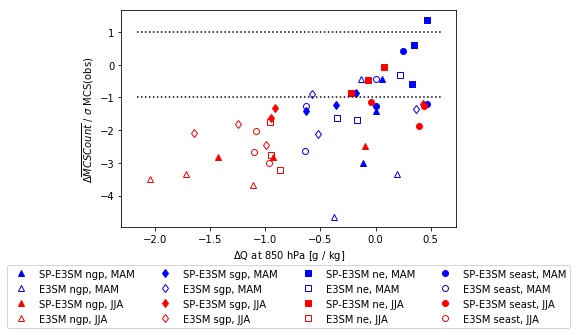

In [68]:
# scatter x-axis: delta_q
# y-axis: bias nMCS(model) -nMCS(facets) /
plot_shapes = {'ne': 's', 'seast': 'o', 'ngp': '^', 'sgp': 'd'}
for i, region in enumerate(regional_count_regions):
    for season in ['MAM', 'JJA']:
        if season == 'MAM':
            months = [3, 4, 5]
            cols = slice(0, 3)
            color = 'b'
        elif season == 'JJA':
            months = [6, 7, 8]
            cols = slice(3, 6)
            color = 'r'
        x1 = 1000 * delta_mmf_regions[region]['Q'].sel(month=months)
        y1 = mmf_count_delta[i, cols] / facets_stdev[i, cols]
        plt.plot(x1, y1, plot_shapes[region], color=color, label='SP-E3SM {}, {}'.format(region, season))
        x2 = 1000 * delta_e3sm_regions[region]['Q'].sel(month=months)
        y2 = e3sm_count_delta[i, cols] / facets_stdev[i, cols]
        plt.plot(x2, y2, plot_shapes[region], color=color, fillstyle='none', label='E3SM {}, {}'.format(region, season))
plt.xlabel('$\Delta$Q at 850 hPa [g / kg]')
plt.ylabel('$\Delta \overline{MCS Count}$ / $\sigma$ MCS(obs)')
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=4)
xlim = plt.xlim()
plt.plot(xlim, [-1, -1], 'k:')
plt.plot(xlim, [1, 1], 'k:')

(0.0, 1.0)

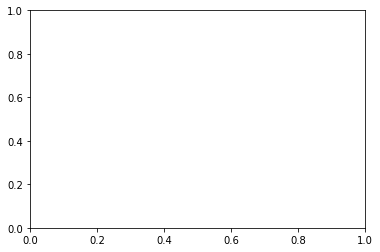

In [60]:
plt.xlim()

# Hourly model output at 925 hPa

In [6]:
ds_mmf = xr.open_mfdataset('/global/cscratch1/sd/crjones/for_fengfei/e3sm-mmf/earlyscience.som.FC5AV1C-H01A.ne120.sp1_64x1_1000m*.nc')

In [12]:
ds_e3sm = xr.open_mfdataset('/global/cscratch1/sd/crjones/for_fengfei/e3sm/earlyscience.som.FC5AV1C-H01A.ne120.E3SM.000*.nc')

In [9]:
def diurnal(ds):
    return ds.groupby('time.hour').mean(dim='time')

In [23]:
ds_mmf_diurnal = ds_mmf.groupby('time.season').apply(diurnal).load()

In [24]:
ds_e3sm_diurnal = ds_e3sm.groupby('time.season').apply(diurnal).load()

In [15]:
ds_era = xr.open_dataset('/global/cscratch1/sd/crjones/era5/era5_1998-2002_ls_monthly_diurnal.nc')
ds_era

<xarray.Dataset>
Dimensions:    (latitude: 721, level: 2, longitude: 1440, time: 240)
Coordinates:
  * longitude  (longitude) float32 0.0 0.25 0.5 0.75 ... 359.25 359.5 359.75
  * latitude   (latitude) float32 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * level      (level) int32 850 925
  * time       (time) datetime64[ns] 1998-03-01 ... 2002-08-01T21:00:00
Data variables:
    q          (time, level, latitude, longitude) float32 ...
    u          (time, level, latitude, longitude) float32 ...
    v          (time, level, latitude, longitude) float32 ...
Attributes:
    Conventions:  CF-1.6
    history:      2019-10-03 22:41:11 GMT by grib_to_netcdf-2.10.0: /opt/ecmw...

In [16]:
ds_era_diurnal = ds_era.groupby('time.season').apply(diurnal)
ds_era_diurnal

<xarray.Dataset>
Dimensions:    (hour: 8, latitude: 721, level: 2, longitude: 1440, season: 2)
Coordinates:
  * longitude  (longitude) float32 0.0 0.25 0.5 0.75 ... 359.25 359.5 359.75
  * latitude   (latitude) float32 90.0 89.75 89.5 89.25 ... -89.5 -89.75 -90.0
  * level      (level) int32 850 925
  * hour       (hour) int64 0 3 6 9 12 15 18 21
  * season     (season) object 'JJA' 'MAM'
Data variables:
    q          (season, hour, level, latitude, longitude) float32 0.0024400325 ... 4.9248836e-05
    u          (season, hour, level, latitude, longitude) float32 -4.8667192e-05 ... -9.936094e-05
    v          (season, hour, level, latitude, longitude) float32 1.8785397e-05 ... 7.277727e-05

In [26]:
[hr for hr in range(0, 24, 3)]

[0, 3, 6, 9, 12, 15, 18, 21]

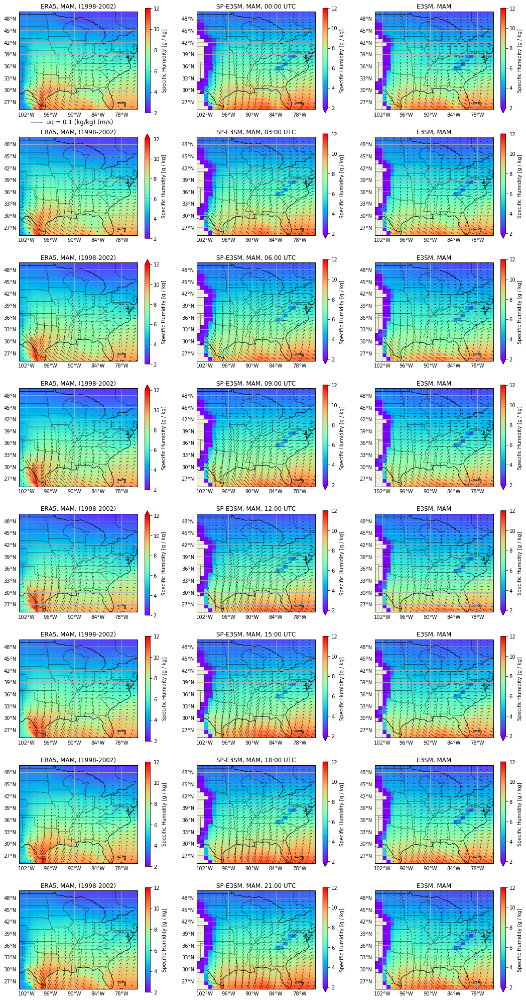

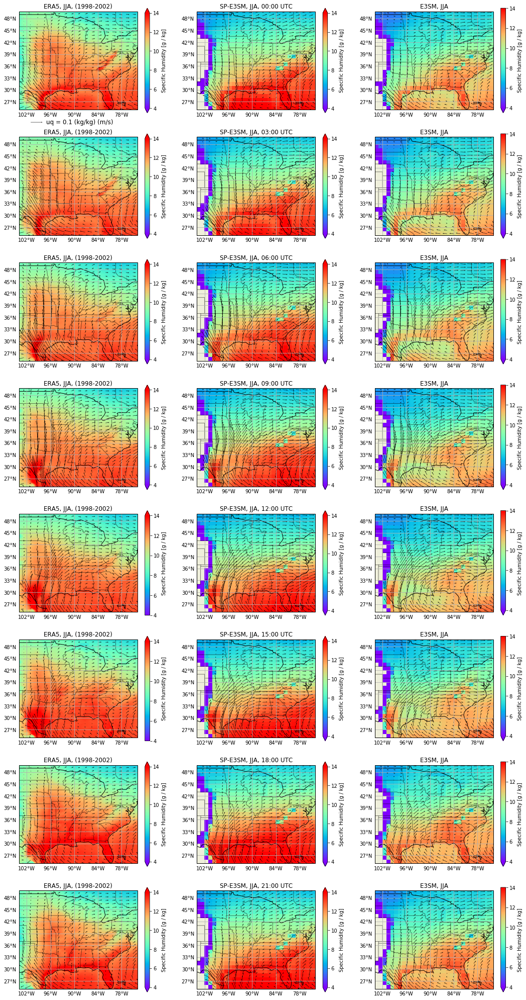

In [36]:
vlims = {'MAM': (2, 12), 'JJA': (4, 14)}
for season in ['MAM', 'JJA']: 
    fig, axes = plt.subplots(nrows=8, ncols=3, figsize=(18, 36), subplot_kw={'projection': ccrs.PlateCarree()})
    for irow, hr in enumerate(range(0, 24, 3)):
        plot_kwargs = {'extent': [256 - 360, 286 - 360, 25, 49], 'nlat': 30, 'nlon': 30,
                       'vmin': vlims[season][0], 'vmax': vlims[season][-1]}
        if irow == 1:
            plot_on_ax(axes[irow, 0], ds_era_diurnal.sel(level=925, hour=hr), data_type='ERA', season=season,
                       dokey=True, ax_title='ERA5, ' + season + ', (1998-2002)',
                       key_pos={'X': 0.2, 'Y': 1.15, 'U': 0.1, 'label': 'uq = 0.1 (kg/kg) (m/s)',
                                'labelpos': 'E', 'fontproperties': {'size': 12}},
                       **plot_kwargs)
        else:
            plot_on_ax(axes[irow, 0], ds_era_diurnal.sel(level=925, hour=hr), data_type='ERA', season=season, dokey=False,
                       ax_title='ERA5, ' + season + ', (1998-2002)', scale=1, **plot_kwargs)
        plot_on_ax(axes[irow, 1], ds_mmf_diurnal.sel(pressure=925, hour=hr), data_type='SP-E3SM', season=season,
                   dokey=False, ax_title='SP-E3SM, {}, {:02d}:00 UTC'.format(season, hr), **plot_kwargs)
        plot_on_ax(axes[irow, 2], ds_e3sm_diurnal.sel(pressure=925, hour=hr), data_type='E3SM', season=season, dokey=False, 
                   ax_title='E3SM, ' + season, **plot_kwargs)
    print('\n\n')
    plt.show()

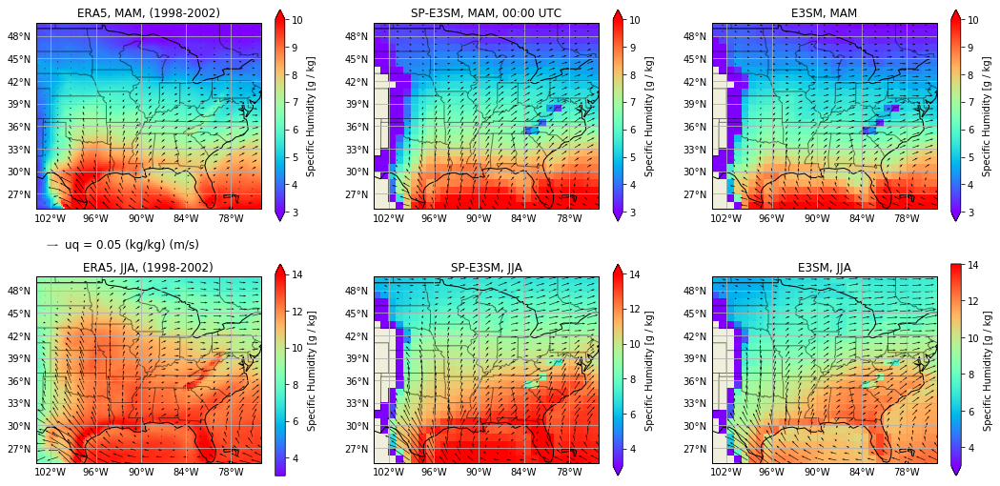

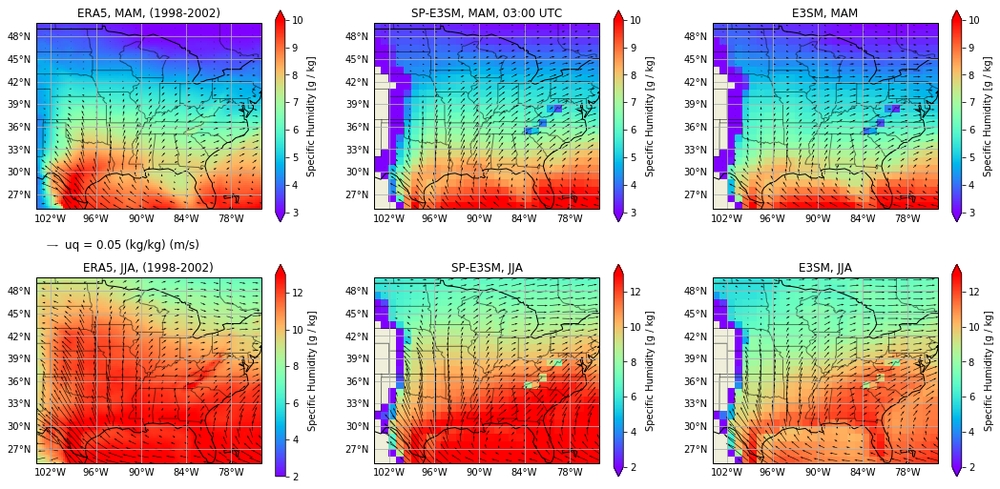

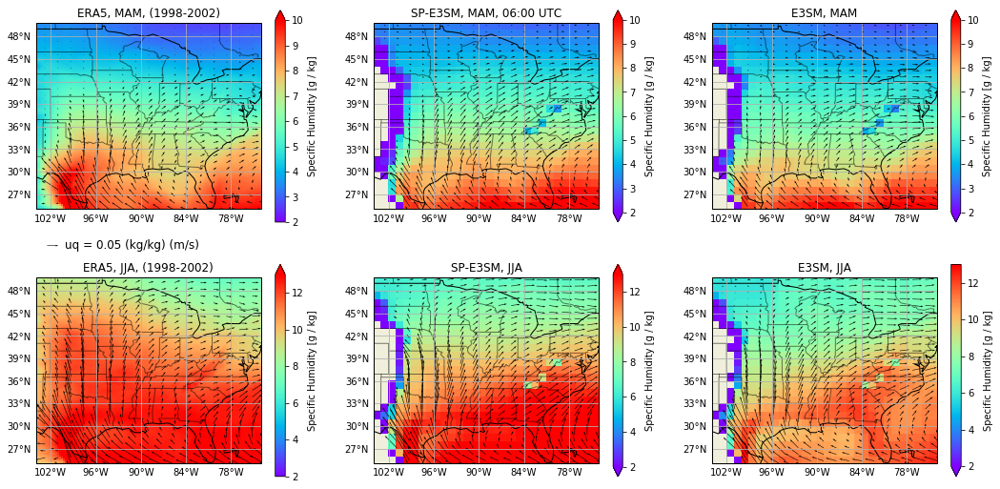

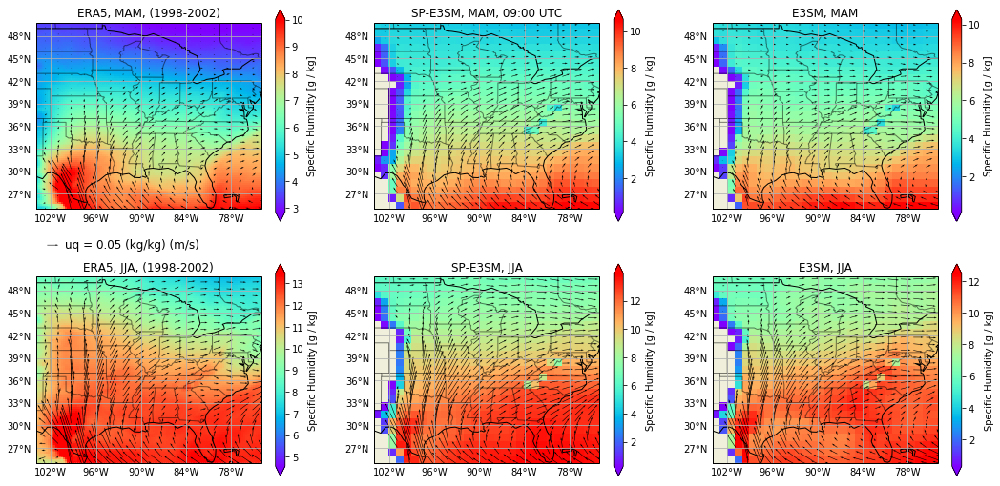

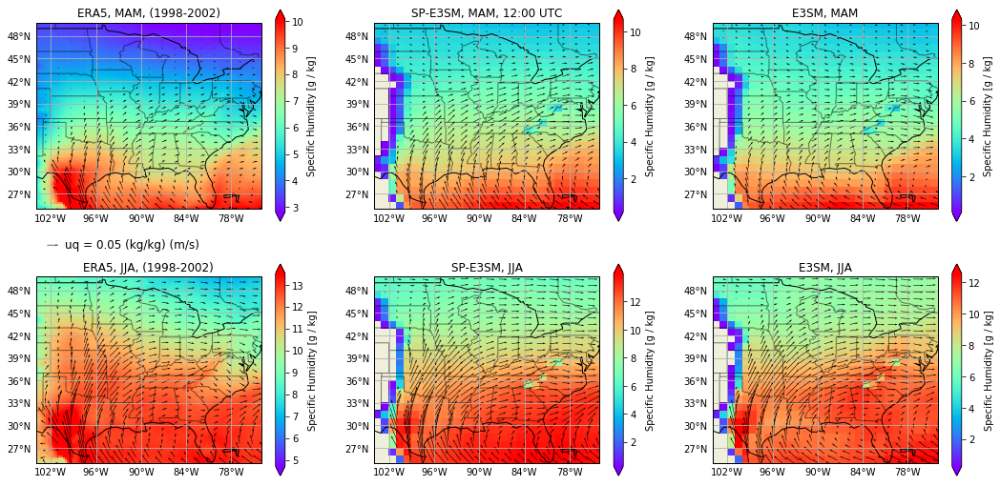

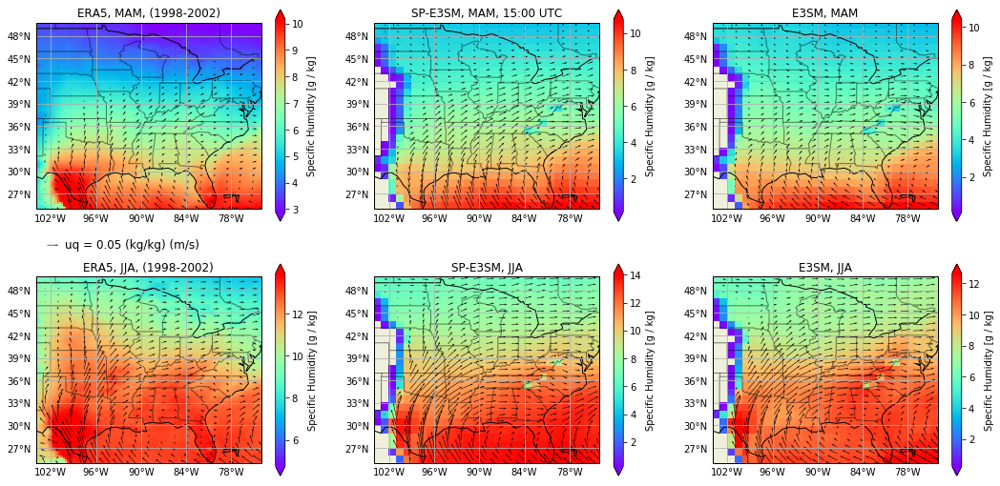

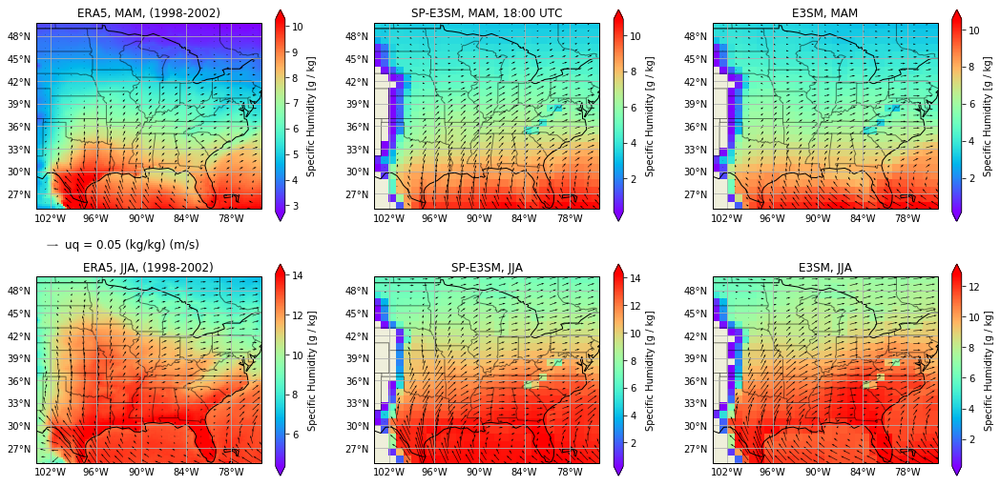

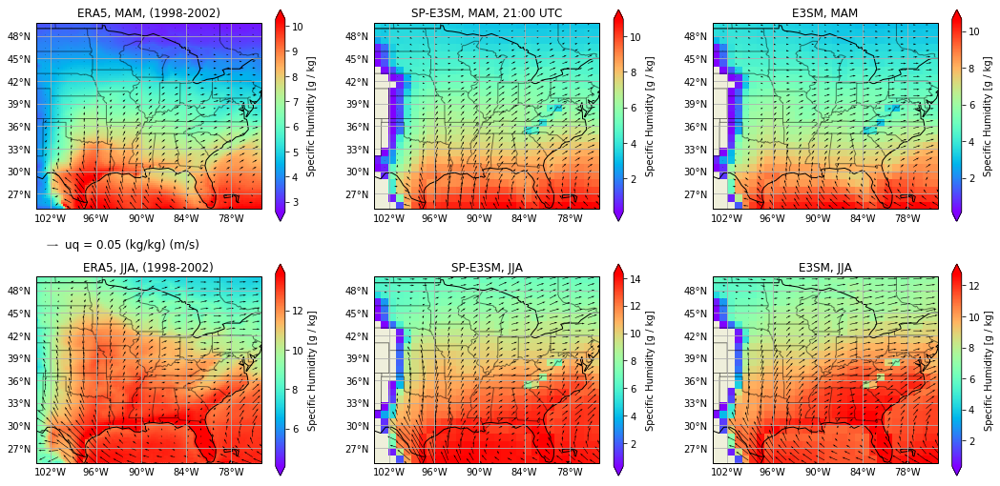

In [30]:
vlims_mam = {0: [3, 10], 3: [3, 10], 6: [2, 10], 9: [2, 10]}
vlims_jja = {0: [3, 14], 3: [2, 13], 6: [2, 13], 9: [2, 13]}
for hr in range(0, 24, 3):
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 9), subplot_kw={'projection': ccrs.PlateCarree()})
    # plot_kwargs_mam = {'vmin': 2, 'vmax': 9, 'extent': [256 - 360, 286 - 360, 25, 49], 'nlat': 40, 'nlon': 40}
    # plot_kwargs_jja = {'vmin': 5, 'vmax': 12, 'extent': [256 - 360, 286 - 360, 25, 49], 'nlat': 40, 'nlon': 40}
    plot_kwargs_mam = {'extent': [256 - 360, 286 - 360, 25, 49], 'nlat': 30, 'nlon': 30}
    plot_kwargs_jja = {'extent': [256 - 360, 286 - 360, 25, 49], 'nlat': 30, 'nlon': 30}
    if hr in vlims_mam:
        plot_kwargs_mam.update(vmin=vlims_mam[hr][0], vmax=vlims_mam[hr][-1])
    if hr in vlims_jja:
        plot_kwargs_jja.update(vmin=vlims_jja[hr][0], vmax=vlims_jja[hr][-1])
    plot_on_ax(axes[0,0], ds_era_diurnal.sel(level=925, hour=hr), data_type='ERA', season='MAM', dokey=False, ax_title='ERA5, MAM, (1998-2002)', scale=1, **plot_kwargs_mam)
    plot_on_ax(axes[1,0], ds_era_diurnal.sel(level=925, hour=hr), data_type='ERA', season='JJA',
               dokey=True, ax_title='ERA5, JJA, (1998-2002)',
               key_pos={'X': 0.1, 'Y': 1.17, 'U': 0.05, 'label': 'uq = 0.05 (kg/kg) (m/s)',
                        'labelpos': 'E', 'fontproperties': {'size': 12}},
               **plot_kwargs_jja)
    plot_on_ax(axes[0,1], ds_mmf_diurnal.sel(pressure=925, hour=hr), data_type='SP-E3SM', season='MAM', dokey=False, ax_title='SP-E3SM, MAM, {:02d}:00 UTC'.format(hr), **plot_kwargs_mam)
    plot_on_ax(axes[1,1], ds_mmf_diurnal.sel(pressure=925, hour=hr), data_type='SP-E3SM', season='JJA',
               dokey=False, ax_title='SP-E3SM, JJA', **plot_kwargs_jja)
    plot_on_ax(axes[0,2], ds_e3sm_diurnal.sel(pressure=925, hour=hr), data_type='E3SM', season='MAM', dokey=False, ax_title='E3SM, MAM', **plot_kwargs_mam)
    plot_on_ax(axes[1,2], ds_e3sm_diurnal.sel(pressure=925, hour=hr), data_type='E3SM', season='JJA', dokey=False, ax_title='E3SM, JJA', **plot_kwargs_jja)
    print('\n\n')
    # plt.savefig('moisture_transport_mam_jja_v2.png', bbox_inches='tight', dpi=600)
    plt.show()

# CONUS interpolation to do this again ...

In [4]:
def hybrid_to_pressure(ds):
    """returns 3D pressure dataArray (units: hPa)"""
    ps = ds['PS']
    hyam = ds['hyam'].load()
    hybm = ds['hybm'].load()
    p0 = 1000
    pres = ps * hybm / 100 + p0 * hyam
    return pres

def interp_to_lev(p, lev, da):
    """ Assumes a singular pressure level """
    levs = np.array([lev])
    da = da.transpose(*p.dims)
    interp = som_interp.ninterp_col_to_pres_level(p.values, levs, da.values).squeeze()
    # pres = xr.DataArray(levs, coords=[levs], dims=['pressure'], attrs={'units': 'hPa', 'long_name': 'pressure'}, name='pressure')
    out_dims = [c for c in da.dims if 'lev' != c]
    return xr.DataArray(interp, coords=[da[c] for c in out_dims], dims=out_dims,
                        name=da.name)

In [5]:
ds_mmf = xr.open_mfdataset('/global/cscratch1/sd/crjones/conus/e3sm-mmf/*.000?-0[2345678]-*.CONUS.nc')
ds_mmf

<xarray.Dataset>
Dimensions:   (lat: 120, lev: 72, lon: 320, nbnd: 2, time: 9080)
Coordinates:
  * lat       (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
  * lon       (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
  * lev       (lev) float64 0.1238 0.1828 0.2699 0.3986 ... 986.2 993.8 998.5
  * time      (time) object 0002-03-01 00:00:00 ... 0007-09-01 21:00:00
Dimensions without coordinates: nbnd
Data variables:
    lat_bnds  (time, lat, nbnd) float64 dask.array<shape=(9080, 120, 2), chunksize=(40, 120, 2)>
    lon_bnds  (time, lon, nbnd) float64 dask.array<shape=(9080, 320, 2), chunksize=(40, 320, 2)>
    gw        (time, lat) float64 dask.array<shape=(9080, 120), chunksize=(40, 120)>
    area      (time, lat, lon) float64 dask.array<shape=(9080, 120, 320), chunksize=(40, 120, 320)>
    PS        (time, lat, lon) float32 dask.array<shape=(9080, 120, 320), chunksize=(40, 120, 320)>
    Q         (time, lev, lat, lon) float32 dask.array<shape=(9

In [6]:
# first reduce to group by season / hour
def diurnal(da):
    return da.groupby('time.hour').mean(dim='time')

In [11]:
ds1 = ds_mmf[['U', 'V', 'Q', 'PS', 'hyam', 'hybm']].groupby('time.season').apply(diurnal).load()
ds1

<xarray.Dataset>
Dimensions:   (hour: 8, lat: 120, lev: 72, lon: 320, nbnd: 2, season: 4)
Coordinates:
  * lat       (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
  * lon       (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
  * lev       (lev) float64 0.1238 0.1828 0.2699 0.3986 ... 986.2 993.8 998.5
  * hour      (hour) int64 0 3 6 9 12 15 18 21
  * season    (season) object 'DJF' 'JJA' 'MAM' 'SON'
Dimensions without coordinates: nbnd
Data variables:
    lat_bnds  (season, hour, lat, nbnd) float64 20.0 20.25 20.25 ... 49.75 50.0
    lon_bnds  (season, hour, lon, nbnd) float64 220.0 220.2 ... 299.8 300.0
    gw        (season, hour, lat) float64 0.004097 0.00409 ... 0.002827 0.002812
    area      (season, hour, lat, lon) float64 1.788e-05 1.788e-05 ... 1.227e-05
    PS        (season, hour, lat, lon) float32 101693.35 101695.0 ... 101372.02
    Q         (season, hour, lev, lat, lon) float32 3.0380384e-06 ... 0.0074151047
    T         (season, h

In [12]:
pres_mmf = hybrid_to_pressure(ds1).load()
pres_mmf

<xarray.DataArray (season: 4, hour: 8, lat: 120, lon: 320, lev: 72)>
array([[[[[1.238254e-01, ..., 1.015404e+03],
          ...,
          [1.238254e-01, ..., 1.020749e+03]],

         ...,

         [[1.238254e-01, ..., 1.005053e+03],
          ...,
          [1.238254e-01, ..., 1.005199e+03]]],


        ...,


        [[[1.238254e-01, ..., 1.016926e+03],
          ...,
          [1.238254e-01, ..., 1.019847e+03]],

         ...,

         [[1.238254e-01, ..., 1.006029e+03],
          ...,
          [1.238254e-01, ..., 1.004500e+03]]]],



       ...,



       [[[[1.238254e-01, ..., 1.013328e+03],
          ...,
          [1.238254e-01, ..., 1.017113e+03]],

         ...,

         [[1.238254e-01, ..., 1.009895e+03],
          ...,
          [1.238254e-01, ..., 1.015508e+03]]],


        ...,


        [[[1.238254e-01, ..., 1.014009e+03],
          ...,
          [1.238254e-01, ..., 1.015014e+03]],

         ...,

         [[1.238254e-01, ..., 1.015278e+03],
          ...,
         

In [13]:
mmf_850 = {v: interp_to_lev(pres_mmf, 850, ds1[v]) for v in ['Q', 'U', 'V']}

{'Q': <xarray.DataArray 'Q' (season: 4, hour: 8, lat: 120, lon: 320)>
 array([[[[0.007035, ..., 0.007646],
          ...,
          [0.002616, ..., 0.001545]],
 
         ...,
 
         [[0.007235, ..., 0.007623],
          ...,
          [0.002179, ..., 0.001584]]],
 
 
        ...,
 
 
        [[[0.01003 , ..., 0.010438],
          ...,
          [0.005437, ..., 0.004129]],
 
         ...,
 
         [[0.008605, ..., 0.010554],
          ...,
          [0.005149, ..., 0.003478]]]])
 Coordinates:
   * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'
   * hour     (hour) int64 0 3 6 9 12 15 18 21
   * lat      (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
   * lon      (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9,
 'U': <xarray.DataArray 'U' (season: 4, hour: 8, lat: 120, lon: 320)>
 array([[[[ -0.162907, ...,  -8.519772],
          ...,
          [  6.415166, ...,  10.305398]],
 
         ...,
 
         [[ -0.174066, ...,  -8.800243],
       

In [9]:
variables_needed = ['PS', 'hyam', 'hybm', 'Q', 'U', 'V']
ds_e3sm_us = ds_e3sm_climo[variables_needed].sel(**conus)
ds_mmf_us = ds_mmf_climo[variables_needed].sel(**conus)

pres_mmf = hybrid_to_pressure(ds_mmf_us)
pres_e3sm = hybrid_to_pressure(ds_e3sm_us)

In [12]:
e3sm_850 = {v: interp_to_lev(pres_e3sm, 850, ds_e3sm_us[v]) for v in ['Q', 'U', 'V']}

In [13]:
mmf_850 = {v: interp_to_lev(pres_mmf, 850, ds_mmf_us[v]) for v in ['Q', 'U', 'V']}

In [14]:
ds850 = xr.concat([xr.Dataset(e3sm_850), xr.Dataset(mmf_850)], dim=pd.Index(['E3SM', 'SP-E3SM'], name='model'))
ds850

<xarray.Dataset>
Dimensions:  (lat: 104, lon: 200, model: 2, season: 2)
Coordinates:
  * season   (season) object 'JJA' 'MAM'
  * lat      (lat) float64 24.12 24.38 24.62 24.88 ... 49.12 49.38 49.62 49.88
  * lon      (lon) float64 240.1 240.4 240.6 240.9 ... 289.1 289.4 289.6 289.9
  * model    (model) object 'E3SM' 'SP-E3SM'
Data variables:
    Q        (model, season, lat, lon) float64 0.005896 0.005956 ... 0.002825
    U        (model, season, lat, lon) float64 -1.919 -1.891 ... 4.378 4.395
    V        (model, season, lat, lon) float64 -1.762 -1.748 ... -0.1436 -0.2042

In [26]:
ds_era2 = ds_era_diurnal.interp(coords={'longitude': ds850.lon, 'latitude': ds850.lat})
ds_era2

<xarray.Dataset>
Dimensions:    (hour: 8, lat: 120, level: 2, lon: 320, season: 2)
Coordinates:
  * level      (level) int32 850 925
  * hour       (hour) int64 0 3 6 9 12 15 18 21
  * season     (season) object 'JJA' 'MAM'
    longitude  (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
    latitude   (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
  * lon        (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
  * lat        (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
Data variables:
    q          (season, hour, level, lat, lon) float64 0.006924 ... 0.00279
    u          (season, hour, level, lat, lon) float64 -6.631 -6.608 ... 1.528
    v          (season, hour, level, lat, lon) float64 -1.988 -2.016 ... -0.6736

In [17]:
ds850 = xr.Dataset(mmf_850)
ds850

<xarray.Dataset>
Dimensions:  (hour: 8, lat: 120, lon: 320, season: 4)
Coordinates:
  * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'
  * hour     (hour) int64 0 3 6 9 12 15 18 21
  * lat      (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
  * lon      (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
Data variables:
    Q        (season, hour, lat, lon) float64 0.007035 0.006983 ... 0.003478
    U        (season, hour, lat, lon) float64 -0.1629 -0.2261 ... 6.147 6.201
    V        (season, hour, lat, lon) float64 1.606 1.545 ... -3.529 -3.402

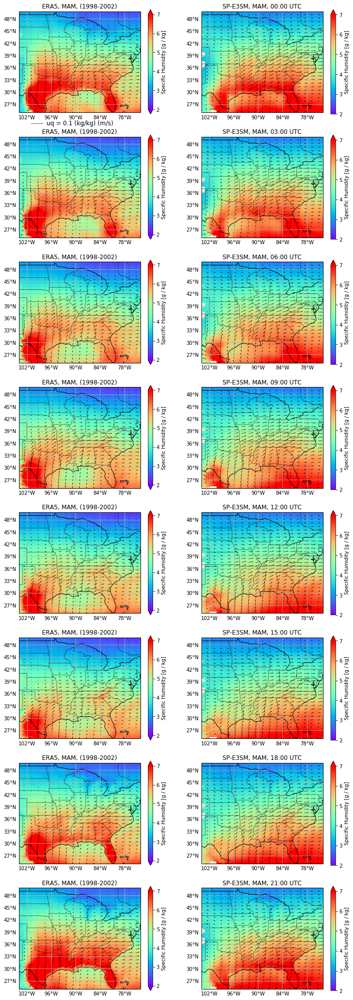

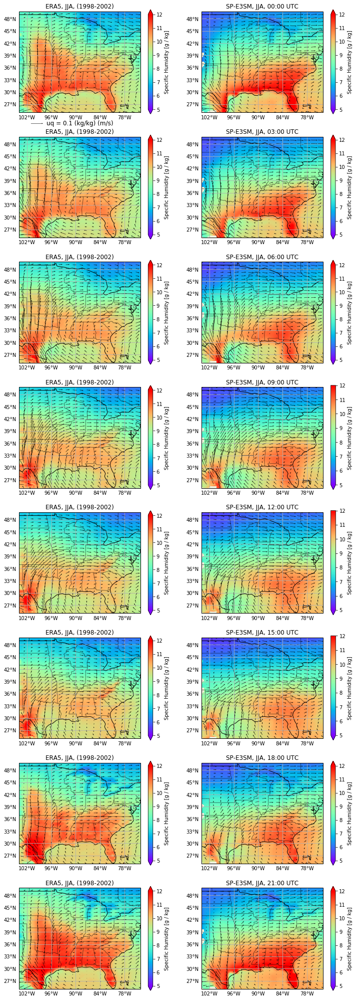

In [23]:
vlims = {'MAM': (2, 7), 'JJA': (5, 12)}
# vlims = {'MAM': (None, None), 'JJA': (None, None)}
lev = 850
for season in ['MAM', 'JJA']: 
    fig, axes = plt.subplots(nrows=8, ncols=2, figsize=(12, 36), subplot_kw={'projection': ccrs.PlateCarree()})
    for irow, hr in enumerate(range(0, 24, 3)):
        plot_kwargs = {'extent': [256 - 360, 286 - 360, 25, 49], 'nlat': 30, 'nlon': 30,
                       'vmin': vlims[season][0], 'vmax': vlims[season][-1]}
        if irow == 1:
            plot_on_ax(axes[irow, 0], ds_era_diurnal.sel(level=lev, hour=hr), data_type='ERA', season=season,
                       dokey=True, ax_title='ERA5, ' + season + ', (1998-2002)',
                       key_pos={'X': 0.2, 'Y': 1.13, 'U': 0.1, 'label': 'uq = 0.1 (kg/kg) (m/s)',
                                'labelpos': 'E', 'fontproperties': {'size': 12}},
                       **plot_kwargs)
        else:
            plot_on_ax(axes[irow, 0], ds_era_diurnal.sel(level=lev, hour=hr), data_type='ERA', season=season, dokey=False,
                       ax_title='ERA5, ' + season + ', (1998-2002)', scale=1, **plot_kwargs)
        plot_on_ax(axes[irow, 1], ds850.sel(hour=hr), data_type='SP-E3SM', season=season,
                   dokey=False, ax_title='SP-E3SM, {}, {:02d}:00 UTC'.format(season, hr), **plot_kwargs)
    print('\n\n')
    plt.show()

In [47]:
def plot_on_ax(ax, ds_climo, extent=[250 - 360, 285 - 360, 28, 49], data_type='ERA',
               season='MAM', dokey=True, ax_title='the title', scale=1, nlon=50, nlat=50,
               key_pos={'X': 0.75, 'Y': 1.02, 'U': 0.05, 'label': 'uq = 0.05 (kg/kg) (m/s)', 'labelpos': 'E'}, **plot_kwargs):
    sel = {'season': season}
    if data_type == 'ERA':
        region = conus_era
        lon = ds_climo['longitude'].sel(longitude=region['longitude'])
        lat = ds_climo['latitude'].sel(latitude=region['latitude'])
        vnames = {'q': 'q', 'u': 'u', 'v': 'v'}
    else:
        region = conus
        lon = ds_climo['lon'].sel(lon=region['lon'])
        lat = ds_climo['lat'].sel(lat=region['lat'])
        vnames = {'q': 'Q', 'u': 'U', 'v': 'V'}
    new_lon = np.linspace(lon[0], lon[-1], nlon)
    new_lat = np.linspace(lat[0], lat[-1], nlat)
    # let's resample ...
    if data_type == 'ERA':
        dsi = ds_climo.sel(**sel, **region).interp(latitude=new_lat, longitude=new_lon)
    else:
        dsi = ds_climo.sel(**sel, **region).interp(lat=new_lat, lon=new_lon)
    u = dsi[vnames['u']]
    v = dsi[vnames['v']]
    q = dsi[vnames['q']]
    ax.add_feature(states_provinces, edgecolor='black', alpha=0.5)
    ax.coastlines()
    ax.set_extent(extent)
    # format gridlines
    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True)
    gl.xlabels_top = False
    gl.ylabels_right = False
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.BORDERS, linestyle='-', alpha=1)
    ax.add_feature(cfeature.LAND)
    if 'cmap' not in plot_kwargs:
        plot_kwargs['cmap'] = plt.cm.rainbow
    pp = (1000 * ds_climo[vnames['q']]).sel(**sel, **region).plot(ax=ax, robust=True, 
                                                                  **plot_kwargs,
                                                                  cbar_kwargs={'label': 'Specific Humidity [g / kg]'})
    uq = dsi['UQ'].values if 'UQ' in dsi else (u * q).values
    vq = dsi['VQ'].values if 'VQ' in dsi else (v * q).values
    pq = ax.quiver(new_lon, new_lat, scale * uq, scale * vq, # scale=scale,
                   transform=ccrs.PlateCarree())
    ax.set_title(ax_title)
    if dokey:
        ax.quiverkey(pq, **key_pos)

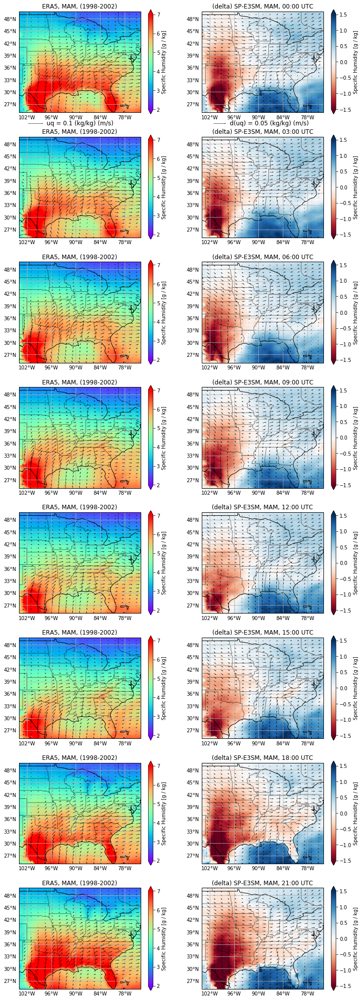

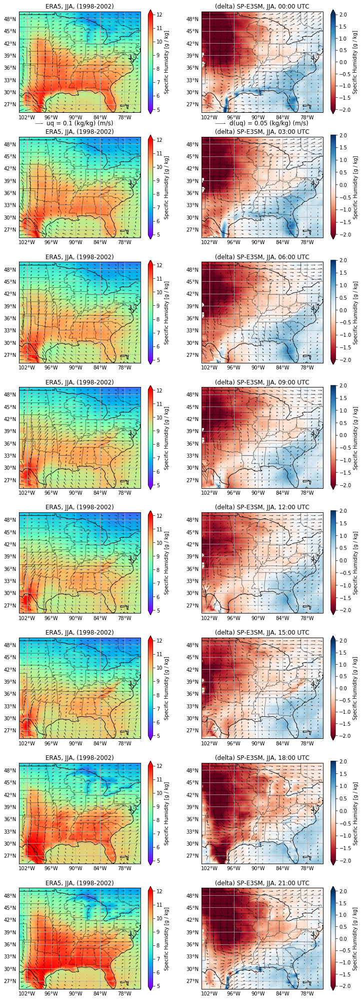

In [56]:
# difference_plots
vlims = {'MAM': (2, 7), 'JJA': (5, 12)}
vlims_delta = {'MAM': (-1.5, 1.5), 'JJA': (-2, 2)}
# vlims = {'MAM': (None, None), 'JJA': (None, None)}
lev = 850
for season in ['MAM', 'JJA']: 
    fig, axes = plt.subplots(nrows=8, ncols=2, figsize=(12, 36), subplot_kw={'projection': ccrs.PlateCarree()})
    for irow, hr in enumerate(range(0, 24, 3)):
        plot_kwargs = {'extent': [256 - 360, 286 - 360, 25, 49], 'nlat': 30, 'nlon': 30,
                       'vmin': vlims[season][0], 'vmax': vlims[season][-1]}
        plot_kwargs_delta = {'extent': [256 - 360, 286 - 360, 25, 49], 'nlat': 30, 'nlon': 30,
                             'cmap': plt.cm.RdBu,
                             'vmin': vlims_delta[season][0], 'vmax': vlims_delta[season][-1]}
        if irow == 1:
            plot_on_ax(axes[irow, 0], ds_era_diurnal.sel(level=lev, hour=hr), data_type='ERA', season=season,
                       dokey=True, ax_title='ERA5, ' + season + ', (1998-2002)',
                       key_pos={'X': 0.2, 'Y': 1.13, 'U': 0.1, 'label': 'uq = 0.1 (kg/kg) (m/s)',
                                'labelpos': 'E', 'fontproperties': {'size': 12}},
                       **plot_kwargs)
            plot_on_ax(axes[irow, 1], delta_850.sel(hour=hr), data_type='SP-E3SM', season=season, scale=10,
                       dokey=True, ax_title='(delta) SP-E3SM, {}, {:02d}:00 UTC'.format(season, hr),
                       key_pos={'X': 0.2, 'Y': 1.13, 'U': 0.5, 'label': 'd(uq) = {} (kg/kg) (m/s)'.format(0.05),
                                'labelpos': 'E', 'fontproperties': {'size': 12}},
                       **plot_kwargs_delta)
        else:
            plot_on_ax(axes[irow, 0], ds_era_diurnal.sel(level=lev, hour=hr), data_type='ERA', season=season, dokey=False,
                       ax_title='ERA5, ' + season + ', (1998-2002)', scale=1, **plot_kwargs)
            plot_on_ax(axes[irow, 1], delta_850.sel(hour=hr), data_type='SP-E3SM', season=season, scale=10,
                       dokey=False, ax_title='(delta) SP-E3SM, {}, {:02d}:00 UTC'.format(season, hr), **plot_kwargs_delta)
    print('\n\n')
    plt.show()

# Trying this a different way ...

In [90]:
ds_mmf_interp = xr.open_mfdataset('/global/cscratch1/sd/crjones/conus/e3sm-mmf/earlyscience.FC5AV1C-H01A.ne120.sp1_64x1_1000m.850hpa.MAM-JJA.000*.CONUS.nc')
ds_e3sm_interp = xr.open_mfdataset('/global/cscratch1/sd/crjones/conus/e3sm/earlyscience.FC5AV1C-H01A.ne120.E3SM.850hpa.MAM-JJA.000*.CONUS.nc')

In [93]:
mmf850 = ds_mmf_interp.groupby('time.season').apply(diurnal).squeeze().load()
e3sm850 = ds_e3sm_interp.groupby('time.season').apply(diurnal).squeeze().load()

/global/homes/c/crjones/.conda/envs/spe3sm_env/lib/python3.7/site-packages/dask/array/numpy_compat.py:28: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/global/homes/c/crjones/.conda/envs/spe3sm_env/lib/python3.7/site-packages/dask/array/numpy_compat.py:28: RuntimeWarning: divide by zero encountered in true_divide
  x = np.divide(x1, x2, out)


In [99]:
mmf850['UQ'] = mmf850['U'] * mmf850['Q']
mmf850['VQ'] = mmf850['V'] * mmf850['Q']
e3sm850['UQ'] = e3sm850['U'] * e3sm850['Q']
e3sm850['VQ'] = e3sm850['V'] * e3sm850['Q']

In [100]:
dmmf = mmf850 - ds_era2.rename({'q': 'Q', 'u': 'U', 'v': 'V'}).sel(level=850).squeeze()
de3sm = e3sm850 - ds_era2.rename({'q': 'Q', 'u': 'U', 'v': 'V'}).sel(level=850).squeeze()

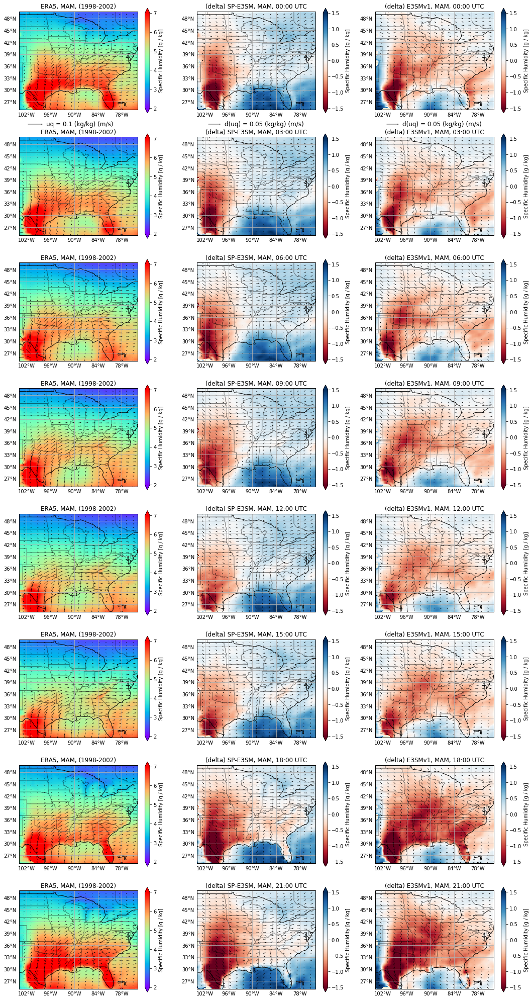

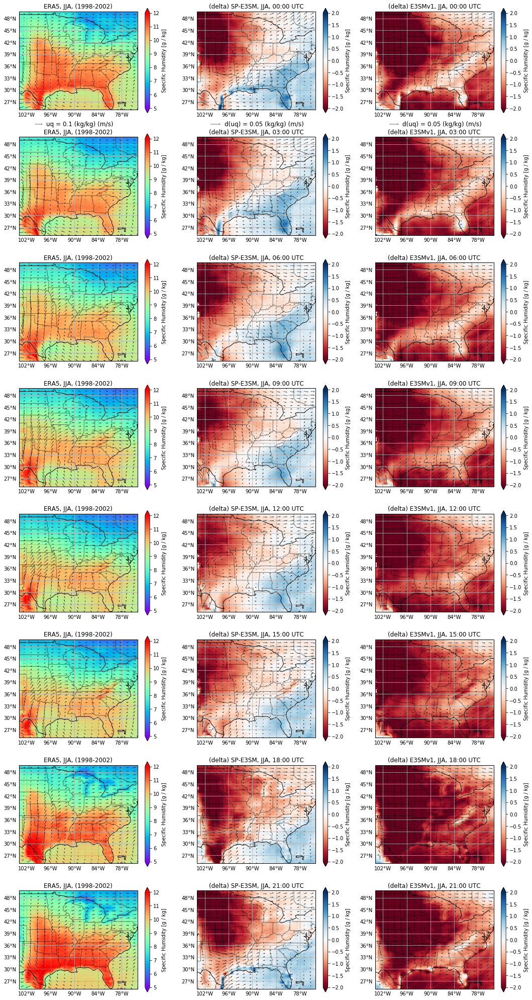

In [102]:
# difference_plots
vlims = {'MAM': (2, 7), 'JJA': (5, 12)}
vlims_delta = {'MAM': (-1.5, 1.5), 'JJA': (-2, 2)}
# vlims = {'MAM': (None, None), 'JJA': (None, None)}
lev = 850
for season in ['MAM', 'JJA']: 
    fig, axes = plt.subplots(nrows=8, ncols=3, figsize=(18, 36), subplot_kw={'projection': ccrs.PlateCarree()})
    for irow, hr in enumerate(range(0, 24, 3)):
        plot_kwargs = {'extent': [256 - 360, 286 - 360, 25, 49], 'nlat': 30, 'nlon': 30,
                       'vmin': vlims[season][0], 'vmax': vlims[season][-1]}
        plot_kwargs_delta = {'extent': [256 - 360, 286 - 360, 25, 49], 'nlat': 30, 'nlon': 30,
                             'cmap': plt.cm.RdBu,
                             'vmin': vlims_delta[season][0], 'vmax': vlims_delta[season][-1]}
        if irow == 1:
            plot_on_ax(axes[irow, 0], ds_era_diurnal.sel(level=lev, hour=hr), data_type='ERA', season=season,
                       dokey=True, ax_title='ERA5, ' + season + ', (1998-2002)',
                       key_pos={'X': 0.2, 'Y': 1.13, 'U': 0.1, 'label': 'uq = 0.1 (kg/kg) (m/s)',
                                'labelpos': 'E', 'fontproperties': {'size': 12}},
                       **plot_kwargs)
            plot_on_ax(axes[irow, 1], dmmf.sel(hour=hr), data_type='SP-E3SM', season=season, scale=10,
                       dokey=True, ax_title='(delta) SP-E3SM, {}, {:02d}:00 UTC'.format(season, hr),
                       key_pos={'X': 0.2, 'Y': 1.13, 'U': 0.5, 'label': 'd(uq) = {} (kg/kg) (m/s)'.format(0.05),
                                'labelpos': 'E', 'fontproperties': {'size': 12}},
                       **plot_kwargs_delta)
            plot_on_ax(axes[irow, 2], de3sm.sel(hour=hr), data_type='E3SMv1', season=season, scale=10,
                       dokey=True, ax_title='(delta) E3SMv1, {}, {:02d}:00 UTC'.format(season, hr),
                       key_pos={'X': 0.2, 'Y': 1.13, 'U': 0.5, 'label': 'd(uq) = {} (kg/kg) (m/s)'.format(0.05),
                                'labelpos': 'E', 'fontproperties': {'size': 12}},
                       **plot_kwargs_delta)
        else:
            plot_on_ax(axes[irow, 0], ds_era_diurnal.sel(level=lev, hour=hr), data_type='ERA', season=season, dokey=False,
                       ax_title='ERA5, ' + season + ', (1998-2002)', scale=1, **plot_kwargs)
            plot_on_ax(axes[irow, 1], dmmf.sel(hour=hr), data_type='SP-E3SM', season=season, scale=10,
                       dokey=False, ax_title='(delta) SP-E3SM, {}, {:02d}:00 UTC'.format(season, hr), **plot_kwargs_delta)
            plot_on_ax(axes[irow, 2], de3sm.sel(hour=hr), data_type='E3SMv1', season=season, scale=10,
                       dokey=False, ax_title='(delta) E3SMv1, {}, {:02d}:00 UTC'.format(season, hr), **plot_kwargs_delta)
    print('\n\n')
    plt.show()

In [57]:
ds_era2

<xarray.Dataset>
Dimensions:    (hour: 8, lat: 120, level: 2, lon: 320, season: 2)
Coordinates:
  * level      (level) int32 850 925
  * hour       (hour) int64 0 3 6 9 12 15 18 21
  * season     (season) object 'JJA' 'MAM'
    longitude  (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
    latitude   (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
  * lon        (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
  * lat        (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
Data variables:
    q          (season, hour, level, lat, lon) float64 0.006924 ... 0.00279
    u          (season, hour, level, lat, lon) float64 -6.631 -6.608 ... 1.528
    v          (season, hour, level, lat, lon) float64 -1.988 -2.016 ... -0.6736
    UQ         (season, hour, level, lat, lon) float64 -0.04592 ... 0.004263
    VQ         (season, hour, level, lat, lon) float64 -0.01377 ... -0.001879

In [35]:
'UQ' in delta_850

True

In [34]:
delta_850 = ds850 - ds_era2.rename({'q': 'Q', 'u': 'U', 'v': 'V'}).sel(level=850).squeeze()
delta_850

<xarray.Dataset>
Dimensions:    (hour: 8, lat: 120, lon: 320, season: 2)
Coordinates:
  * season     (season) object 'JJA' 'MAM'
  * hour       (hour) int64 0 3 6 9 12 15 18 21
  * lat        (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
  * lon        (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
    level      int32 850
    longitude  (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
    latitude   (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
Data variables:
    Q          (season, hour, lat, lon) float64 0.0008814 ... 0.0001257
    U          (season, hour, lat, lon) float64 0.553 0.5583 ... 2.01 1.995
    V          (season, hour, lat, lon) float64 0.4838 0.4937 ... -0.4042
    UQ         (season, hour, lat, lon) float64 -0.001529 -0.001486 ... 0.005563
    VQ         (season, hour, lat, lon) float64 0.002024 0.002063 ... -0.001089

In [32]:
ds_era2['UQ'] = ds_era2['u']*ds_era2['q']
ds_era2['VQ'] = ds_era2['v']*ds_era2['q']
ds_era2

<xarray.Dataset>
Dimensions:    (hour: 8, lat: 120, level: 2, lon: 320, season: 2)
Coordinates:
  * level      (level) int32 850 925
  * hour       (hour) int64 0 3 6 9 12 15 18 21
  * season     (season) object 'JJA' 'MAM'
    longitude  (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
    latitude   (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
  * lon        (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
  * lat        (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
Data variables:
    q          (season, hour, level, lat, lon) float64 0.006924 ... 0.00279
    u          (season, hour, level, lat, lon) float64 -6.631 -6.608 ... 1.528
    v          (season, hour, level, lat, lon) float64 -1.988 -2.016 ... -0.6736
    UQ         (season, hour, level, lat, lon) float64 -0.04592 ... 0.004263
    VQ         (season, hour, level, lat, lon) float64 -0.01377 ... -0.001879

In [33]:
ds850['UQ'] = ds850['U'] * ds850['Q']
ds850['VQ'] = ds850['V'] * ds850['Q']
ds850

<xarray.Dataset>
Dimensions:  (hour: 8, lat: 120, lon: 320, season: 4)
Coordinates:
  * season   (season) object 'DJF' 'JJA' 'MAM' 'SON'
  * hour     (hour) int64 0 3 6 9 12 15 18 21
  * lat      (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
  * lon      (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
Data variables:
    Q        (season, hour, lat, lon) float64 0.007035 0.006983 ... 0.003478
    U        (season, hour, lat, lon) float64 -0.1629 -0.2261 ... 6.147 6.201
    V        (season, hour, lat, lon) float64 1.606 1.545 ... -3.529 -3.402
    UQ       (season, hour, lat, lon) float64 -0.001146 -0.001579 ... 0.02156
    VQ       (season, hour, lat, lon) float64 0.0113 0.01079 ... -0.01183

In [ ]:
# (u + du, v + dv) * (q + dq) = (u * dq + du * q, v * dq + dv * q)

In [58]:
dsx = xr.open_mfdataset('/global/cscratch1/sd/crjones/conus/tmp/earlyscience.FC5AV1C-H01A.ne120.sp1_64x1_1000m.850hpa.000*.CONUS.nc')
dsx

<xarray.Dataset>
Dimensions:   (lat: 120, lon: 320, pressure: 1, time: 11280)
Coordinates:
  * lat       (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
  * lon       (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
  * pressure  (pressure) int64 850
  * time      (time) object 0002-03-01 00:00:00 ... 0007-12-30 21:00:00
Data variables:
    U         (time, pressure, lat, lon) float32 dask.array<shape=(11280, 1, 120, 320), chunksize=(40, 1, 120, 320)>
    V         (time, pressure, lat, lon) float32 dask.array<shape=(11280, 1, 120, 320), chunksize=(40, 1, 120, 320)>
    Q         (time, pressure, lat, lon) float32 dask.array<shape=(11280, 1, 120, 320), chunksize=(40, 1, 120, 320)>
Attributes:
    ne:                        120
    np:                        4
    Conventions:               CF-1.0
    source:                    CAM
    case:                      earlyscience.FC5AV1C-H01A.ne120.sp1_64x1_1000m...
    title:                     UNSET
    

In [76]:
months = dsx['time.month']
to_sel = np.isin(months, [3, 4, 5, 6, 7, 8])

In [75]:
months

<xarray.DataArray 'month' (time: 11280)>
array([ 3,  3,  3, ..., 12, 12, 12])
Coordinates:
  * time     (time) object 0002-03-01 00:00:00 ... 0007-12-30 21:00:00

In [77]:
dsx.sel(time=to_sel)

<xarray.Dataset>
Dimensions:   (lat: 120, lon: 320, pressure: 1, time: 8832)
Coordinates:
  * lat       (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
  * lon       (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
  * pressure  (pressure) int64 850
  * time      (time) object 0002-03-01 00:00:00 ... 0007-08-31 21:00:00
Data variables:
    U         (time, pressure, lat, lon) float32 dask.array<shape=(8832, 1, 120, 320), chunksize=(40, 1, 120, 320)>
    V         (time, pressure, lat, lon) float32 dask.array<shape=(8832, 1, 120, 320), chunksize=(40, 1, 120, 320)>
    Q         (time, pressure, lat, lon) float32 dask.array<shape=(8832, 1, 120, 320), chunksize=(40, 1, 120, 320)>
Attributes:
    ne:                        120
    np:                        4
    Conventions:               CF-1.0
    source:                    CAM
    case:                      earlyscience.FC5AV1C-H01A.ne120.sp1_64x1_1000m...
    title:                     UNSET
    logn

In [78]:
yrs, dsets = zip(*dsx.sel(time=to_sel).groupby('time.year'))
print(yrs)
print(dsets)

(2, 3, 4, 5, 6, 7)
(<xarray.Dataset>
Dimensions:   (lat: 120, lon: 320, pressure: 1, time: 1472)
Coordinates:
  * lat       (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
  * lon       (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
  * pressure  (pressure) int64 850
  * time      (time) object 0002-03-01 00:00:00 ... 0002-08-31 21:00:00
Data variables:
    U         (time, pressure, lat, lon) float32 dask.array<shape=(1472, 1, 120, 320), chunksize=(40, 1, 120, 320)>
    V         (time, pressure, lat, lon) float32 dask.array<shape=(1472, 1, 120, 320), chunksize=(40, 1, 120, 320)>
    Q         (time, pressure, lat, lon) float32 dask.array<shape=(1472, 1, 120, 320), chunksize=(40, 1, 120, 320)>
Attributes:
    ne:                        120
    np:                        4
    Conventions:               CF-1.0
    source:                    CAM
    case:                      earlyscience.FC5AV1C-H01A.ne120.sp1_64x1_1000m...
    title:               

In [79]:
path_out = '/global/cscratch1/sd/crjones/conus/e3sm-mmf/'
fprefix = 'earlyscience.FC5AV1C-H01A.ne120.sp1_64x1_1000m.850hpa.MAM-JJA.'
fsuffix = '.CONUS.nc'
out_files = [path_out + fprefix + dsets[d].time[0].item().strftime('%Y').replace(' ', '0') + fsuffix for d in range(len(yrs))]
out_files

['/global/cscratch1/sd/crjones/conus/e3sm-mmf/earlyscience.FC5AV1C-H01A.ne120.sp1_64x1_1000m.850hpa.MAM-JJA.0002.CONUS.nc',
 '/global/cscratch1/sd/crjones/conus/e3sm-mmf/earlyscience.FC5AV1C-H01A.ne120.sp1_64x1_1000m.850hpa.MAM-JJA.0003.CONUS.nc',
 '/global/cscratch1/sd/crjones/conus/e3sm-mmf/earlyscience.FC5AV1C-H01A.ne120.sp1_64x1_1000m.850hpa.MAM-JJA.0004.CONUS.nc',
 '/global/cscratch1/sd/crjones/conus/e3sm-mmf/earlyscience.FC5AV1C-H01A.ne120.sp1_64x1_1000m.850hpa.MAM-JJA.0005.CONUS.nc',
 '/global/cscratch1/sd/crjones/conus/e3sm-mmf/earlyscience.FC5AV1C-H01A.ne120.sp1_64x1_1000m.850hpa.MAM-JJA.0006.CONUS.nc',
 '/global/cscratch1/sd/crjones/conus/e3sm-mmf/earlyscience.FC5AV1C-H01A.ne120.sp1_64x1_1000m.850hpa.MAM-JJA.0007.CONUS.nc']

In [80]:
xr.save_mfdataset(dsets, out_files)

# E3SM

In [81]:
dsx = xr.open_mfdataset('/global/cscratch1/sd/crjones/conus/tmp/earlyscience.FC5AV1C-H01A.ne120.E3SM.850hpa.000*.CONUS.nc')
dsx

<xarray.Dataset>
Dimensions:   (lat: 120, lon: 320, pressure: 1, time: 6000)
Coordinates:
  * lat       (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
  * lon       (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
  * pressure  (pressure) int64 850
  * time      (time) object 0001-02-25 00:00:00 ... 0003-11-01 21:00:00
Data variables:
    U         (time, pressure, lat, lon) float32 dask.array<shape=(6000, 1, 120, 320), chunksize=(40, 1, 120, 320)>
    V         (time, pressure, lat, lon) float32 dask.array<shape=(6000, 1, 120, 320), chunksize=(40, 1, 120, 320)>
    Q         (time, pressure, lat, lon) float32 dask.array<shape=(6000, 1, 120, 320), chunksize=(40, 1, 120, 320)>
Attributes:
    ne:                        120
    np:                        4
    Conventions:               CF-1.0
    source:                    CAM
    case:                      earlyscience.FC5AV1C-H01A.ne120.E3SM.20190329
    title:                     UNSET
    logname:

In [82]:
months = dsx['time.month']
to_sel = np.isin(months, [3, 4, 5, 6, 7, 8])
dsx.sel(time=to_sel)

<xarray.Dataset>
Dimensions:   (lat: 120, lon: 320, pressure: 1, time: 4416)
Coordinates:
  * lat       (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
  * lon       (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
  * pressure  (pressure) int64 850
  * time      (time) object 0001-03-01 00:00:00 ... 0003-08-31 21:00:00
Data variables:
    U         (time, pressure, lat, lon) float32 dask.array<shape=(4416, 1, 120, 320), chunksize=(8, 1, 120, 320)>
    V         (time, pressure, lat, lon) float32 dask.array<shape=(4416, 1, 120, 320), chunksize=(8, 1, 120, 320)>
    Q         (time, pressure, lat, lon) float32 dask.array<shape=(4416, 1, 120, 320), chunksize=(8, 1, 120, 320)>
Attributes:
    ne:                        120
    np:                        4
    Conventions:               CF-1.0
    source:                    CAM
    case:                      earlyscience.FC5AV1C-H01A.ne120.E3SM.20190329
    title:                     UNSET
    logname:   

In [83]:
yrs, dsets = zip(*dsx.sel(time=to_sel).groupby('time.year'))
print(yrs)
# print(dsets)

(1, 2, 3)


In [84]:
path_out = '/global/cscratch1/sd/crjones/conus/e3sm/'
fprefix = 'earlyscience.FC5AV1C-H01A.ne120.E3SM.850hpa.MAM-JJA.'
fsuffix = '.CONUS.nc'
out_files = [path_out + fprefix + dsets[d].time[0].item().strftime('%Y').replace(' ', '0') + fsuffix for d in range(len(yrs))]
out_files

['/global/cscratch1/sd/crjones/conus/e3sm/earlyscience.FC5AV1C-H01A.ne120.E3SM.850hpa.MAM-JJA.0001.CONUS.nc',
 '/global/cscratch1/sd/crjones/conus/e3sm/earlyscience.FC5AV1C-H01A.ne120.E3SM.850hpa.MAM-JJA.0002.CONUS.nc',
 '/global/cscratch1/sd/crjones/conus/e3sm/earlyscience.FC5AV1C-H01A.ne120.E3SM.850hpa.MAM-JJA.0003.CONUS.nc']

In [85]:
xr.save_mfdataset(dsets, out_files)

# Seasonal mean

In [104]:
mmf850

<xarray.Dataset>
Dimensions:   (hour: 8, lat: 120, lon: 320, season: 2)
Coordinates:
  * lat       (lat) float64 20.12 20.38 20.62 20.88 ... 49.12 49.38 49.62 49.88
  * lon       (lon) float64 220.1 220.4 220.6 220.9 ... 299.1 299.4 299.6 299.9
    pressure  int64 850
  * hour      (hour) int64 0 3 6 9 12 15 18 21
  * season    (season) object 'JJA' 'MAM'
Data variables:
    U         (season, hour, lat, lon) float32 -6.0739822 -6.045409 ... 4.479397
    V         (season, hour, lat, lon) float32 -1.5016471 ... -0.66949344
    Q         (season, hour, lat, lon) float32 0.0078093824 ... 0.002633863
    UQ        (season, hour, lat, lon) float32 -0.04743405 ... 0.011798117
    VQ        (season, hour, lat, lon) float32 -0.011726936 ... -0.0017633539

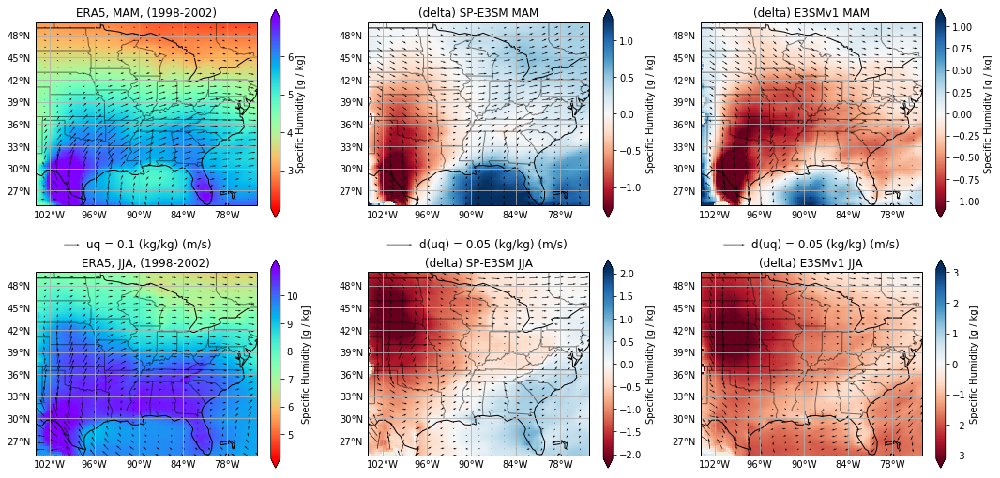

In [117]:
# difference_plots
vlims = {'MAM': (2, 7), 'JJA': (5, 12)}
vlims_delta = {'MAM': (-1.5, 1.5), 'JJA': (-2, 2)}
vlims = {'MAM': (None, None), 'JJA': (None, None)}
vlims_delta = {'MAM': (None, None), 'JJA': (None, None)}

lev = 850
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 9), subplot_kw={'projection': ccrs.PlateCarree()})
for irow, season in enumerate(['MAM', 'JJA']):
    plot_kwargs = {'extent': [256 - 360, 286 - 360, 25, 49], 'nlat': 30, 'nlon': 30,
                   'cmap': plt.cm.rainbow_r,
                   'vmin': vlims[season][0], 'vmax': vlims[season][-1]}
    plot_kwargs_delta = {'extent': [256 - 360, 286 - 360, 25, 49], 'nlat': 30, 'nlon': 30,
                         'cmap': plt.cm.RdBu,
                         'vmin': vlims_delta[season][0], 'vmax': vlims_delta[season][-1]}
    if irow == 1:
        plot_on_ax(axes[irow, 0], ds_era_diurnal.sel(level=lev).mean(dim='hour'), data_type='ERA', season=season,
                   dokey=True, ax_title='ERA5, ' + season + ', (1998-2002)',
                   key_pos={'X': 0.2, 'Y': 1.15, 'U': 0.1, 'label': 'uq = 0.1 (kg/kg) (m/s)',
                            'labelpos': 'E', 'fontproperties': {'size': 12}},
                   **plot_kwargs)
        plot_on_ax(axes[irow, 1], dmmf.mean(dim='hour'), data_type='SP-E3SM', season=season, scale=10,
                   dokey=True, ax_title='(delta) SP-E3SM {}'.format(season),
                   key_pos={'X': 0.2, 'Y': 1.15, 'U': 0.5, 'label': 'd(uq) = {} (kg/kg) (m/s)'.format(0.05),
                            'labelpos': 'E', 'fontproperties': {'size': 12}},
                   **plot_kwargs_delta)
        plot_on_ax(axes[irow, 2], de3sm.mean(dim='hour'), data_type='E3SMv1', season=season, scale=10,
                   dokey=True, ax_title='(delta) E3SMv1 {}'.format(season),
                   key_pos={'X': 0.2, 'Y': 1.15, 'U': 0.5, 'label': 'd(uq) = {} (kg/kg) (m/s)'.format(0.05),
                            'labelpos': 'E', 'fontproperties': {'size': 12}},
                   **plot_kwargs_delta)
    else:
        plot_on_ax(axes[irow, 0], ds_era_diurnal.sel(level=lev).mean(dim='hour'), data_type='ERA', season=season, dokey=False,
                   ax_title='ERA5, ' + season + ', (1998-2002)', scale=1, **plot_kwargs)
        plot_on_ax(axes[irow, 1], dmmf.mean(dim='hour'), data_type='SP-E3SM', season=season, scale=10,
                   dokey=False, ax_title='(delta) SP-E3SM {}'.format(season), **plot_kwargs_delta)
        plot_on_ax(axes[irow, 2], de3sm.mean(dim='hour'), data_type='E3SMv1', season=season, scale=10,
                   dokey=False, ax_title='(delta) E3SMv1 {}'.format(season), **plot_kwargs_delta)